# Goals

*   Print sub-samples of each image, so that the effects of ground vs. noisy vs. filtered are more noticeable (64x64, 128x128, 256x256).



# Measure the Noise between the Noisy and Ground Truth Images Using the SSIM and PSNR Metrics

*  SSIM > 0.9: Excellent similarity. The reconstructed/filtered image closely resembles the original image.
*  0.7 < SSIM < 0.9: Good similarity. The reconstructed/filtered image has some minor differences but still maintains a high level of similarity to the original image.
*  0.5 < SSIM < 0.7: Moderate similarity. The reconstructed/filtered image has noticeable differences but still retains some level of similarity to the original image.
*  SSIM < 0.5: Poor similarity. The reconstructed/filtered image has significant differences and may not be visually similar to the original image. differences.

*   ############################################################

*   PSNR > 40 dB: Excellent quality. The reconstructed/filtered image closely resembles the original image.
*   30 dB < PSNR < 40 dB: Good quality. The reconstructed/filtered image has some minor imperfections but is still visually similar to the original image.
*    20 dB < PSNR < 30 dB: Moderate quality. The reconstructed/filtered image has noticeable distortions or noise but is still recognizable.
*    PSNR < 20 dB: Poor quality. The reconstructed/filtered image has significant distortions or noise and may differ significantly from the original image.

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

ground_markers_1 = 'SIDD_image_files_full_resolution/0035_GT_SRGB_010.PNG'
ground_markers_2 = 'SIDD_image_files_full_resolution/0035_GT_SRGB_011.PNG'
noisy_markers_1 = 'SIDD_image_files_full_resolution/0035_NOISY_SRGB_010.PNG'
noisy_markers_2 = 'SIDD_image_files_full_resolution/0035_NOISY_SRGB_011.PNG'

ground_peppers_1 = 'SIDD_image_files_full_resolution/0102_GT_SRGB_010.PNG'
ground_peppers_2 = 'SIDD_image_files_full_resolution/0102_GT_SRGB_011.PNG'
noisy_peppers_1 = 'SIDD_image_files_full_resolution/0102_NOISY_SRGB_010.PNG'
noisy_peppers_2 = 'SIDD_image_files_full_resolution/0102_NOISY_SRGB_011.PNG'

image_list = [ground_markers_1, ground_markers_2, noisy_markers_1, noisy_markers_2, ground_peppers_1, ground_peppers_2, noisy_peppers_1, noisy_peppers_2]

ground_image_list = [ground_markers_1, ground_markers_2, ground_peppers_1, ground_peppers_2]
noisy_image_list = [noisy_markers_1, noisy_markers_2, noisy_peppers_1, noisy_peppers_2]

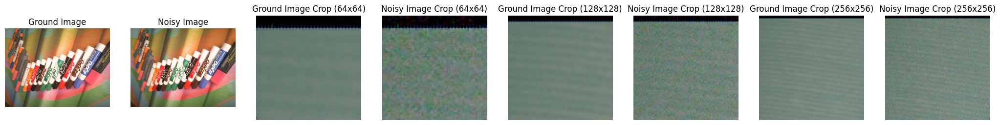

SSIM: 0.7381134606383734



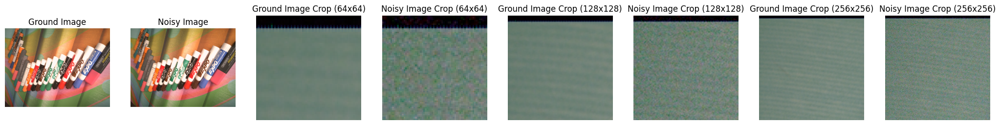

SSIM: 0.7382935925411256



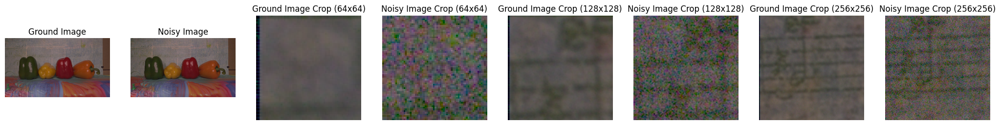

SSIM: 0.5246222882610855



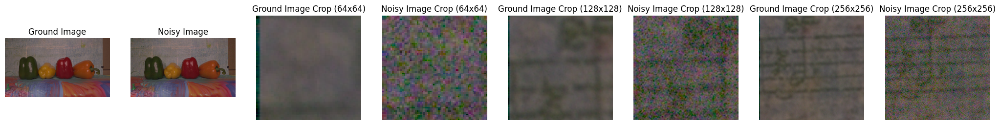

SSIM: 0.5249651638960459

Average SSIM Score: 0.6315


In [2]:
from skimage.metrics import structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Create an empty list to store the SSIM scores
ssim_scores = []

for ground_image_path, noisy_image_path in zip(ground_image_list, noisy_image_list):
    ground_image = Image.open(ground_image_path)
    noisy_image = Image.open(noisy_image_path)

    # Set the figure size for better visualization
    plt.figure(figsize=(26, 8))

    # Plot and print ground image
    plt.subplot(1, 8, 1)
    plt.imshow(ground_image)
    plt.title('Ground Image')
    plt.axis('off')

    # Plot and print noisy image
    plt.subplot(1, 8, 2)
    plt.imshow(noisy_image)
    plt.title('Noisy Image')
    plt.axis('off')

    plt.subplot(1, 8, 3)
    plt.imshow(ground_image.crop((0, 0, 64, 64)))
    plt.title('Ground Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 4)
    plt.imshow(noisy_image.crop((0, 0, 64, 64)))
    plt.title('Noisy Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 5)
    plt.imshow(ground_image.crop((0, 0, 128, 128)))
    plt.title('Ground Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 6)
    plt.imshow(noisy_image.crop((0, 0, 128, 128)))
    plt.title('Noisy Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 7)
    plt.imshow(ground_image.crop((0, 0, 256, 256)))
    plt.title('Ground Image Crop (256x256)')
    plt.axis('off')

    plt.subplot(1, 8, 8)
    plt.imshow(noisy_image.crop((0, 0, 256, 256)))
    plt.title('Noisy Image Crop (256x256)')
    plt.axis('off')

    plt.show()

    # Convert to grayscale and NumPy arrays
    ground_image = np.array(ground_image.convert('L'))
    noisy_image = np.array(noisy_image.convert('L'))

    # Calculate SSIM
    ssim_score = ssim(ground_image, noisy_image)
    print(f"SSIM: {ssim_score}\n")

    # Append the SSIM score to the list
    ssim_scores.append(ssim_score)

# Calculate the average SSIM score
average_ssim = np.mean(ssim_scores)
print(f"Average SSIM Score: {average_ssim:.4f}")

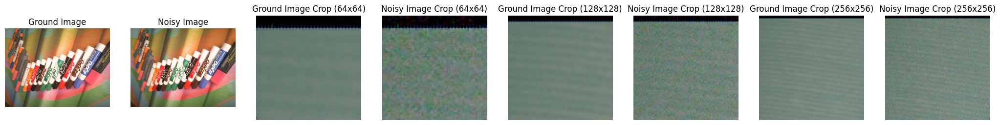

PSNR: 28.11544065482302



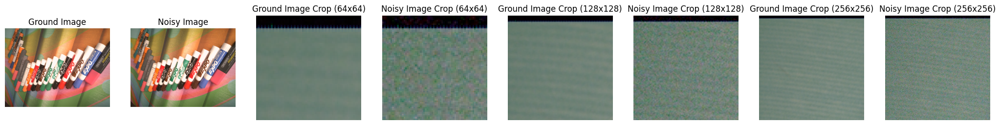

PSNR: 28.11858531127725



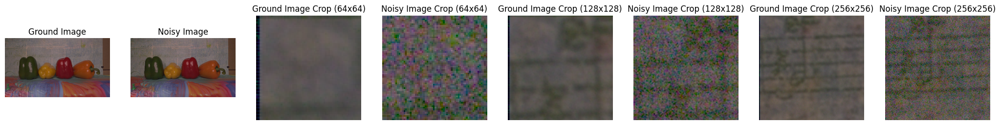

PSNR: 25.845194551863987



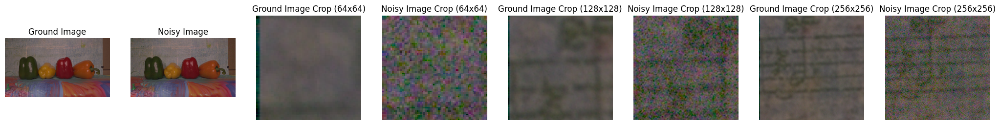

PSNR: 25.847111043274825

Average PSNR Score: 26.9816


In [3]:
from skimage.metrics import peak_signal_noise_ratio as psnr

# Create an empty list to store the PSNR scores
psnr_scores = []

for ground_image_path, noisy_image_path in zip(ground_image_list, noisy_image_list):
    ground_image = Image.open(ground_image_path)
    noisy_image = Image.open(noisy_image_path)

    # Set the figure size for better visualization
    plt.figure(figsize=(26, 8))

    # Plot and print ground image
    plt.subplot(1, 8, 1)
    plt.imshow(ground_image)
    plt.title('Ground Image')
    plt.axis('off')

    # Plot and print noisy image
    plt.subplot(1, 8, 2)
    plt.imshow(noisy_image)
    plt.title('Noisy Image')
    plt.axis('off')

    plt.subplot(1, 8, 3)
    plt.imshow(ground_image.crop((0, 0, 64, 64)))
    plt.title('Ground Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 4)
    plt.imshow(noisy_image.crop((0, 0, 64, 64)))
    plt.title('Noisy Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 5)
    plt.imshow(ground_image.crop((0, 0, 128, 128)))
    plt.title('Ground Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 6)
    plt.imshow(noisy_image.crop((0, 0, 128, 128)))
    plt.title('Noisy Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 7)
    plt.imshow(ground_image.crop((0, 0, 256, 256)))
    plt.title('Ground Image Crop (256x256)')
    plt.axis('off')

    plt.subplot(1, 8, 8)
    plt.imshow(noisy_image.crop((0, 0, 256, 256)))
    plt.title('Noisy Image Crop (256x256)')
    plt.axis('off')

    plt.show()

    # Convert to NumPy arrays
    ground_image = np.array(ground_image)
    noisy_image = np.array(noisy_image)

    # Calculate PSNR
    psnr_score = psnr(ground_image, noisy_image)
    print(f"PSNR: {psnr_score}\n")

    # Append the PSNR score to the list
    psnr_scores.append(psnr_score)

# Calculate the average PSNR score
average_psnr = np.mean(psnr_scores)
print(f"Average PSNR Score: {average_psnr:.4f}")

# Take the Noisy Images and Apply a Gaussian Filter to “Clean Up” the Images

*   Explore parameters to get the “cleanest” images (don't spend too much time).
*   Measure how long it takes to apply the gaussian filter to an image.



C:\Users\anish\AppData\Local\Temp\ipykernel_39492\2399611260.py:26: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  filtered_image = gaussian(normalized_image_arr, sigma=sigma, truncate=truncate, multichannel=True)


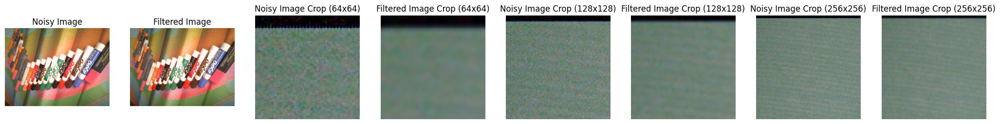

Execution Time: 1.1333 seconds



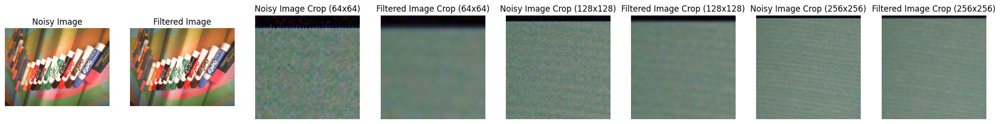

Execution Time: 1.1888 seconds



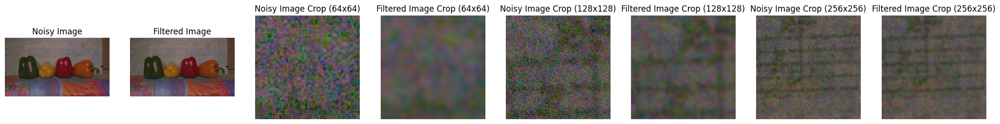

Execution Time: 1.6032 seconds



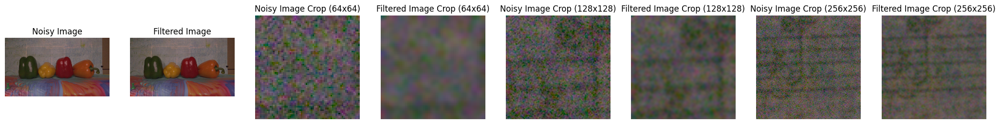

Execution Time: 1.6160 seconds

Average Execution Time: 1.3853 seconds



In [4]:
from skimage.filters import gaussian
import time

noisy_image_list = [noisy_markers_1, noisy_markers_2, noisy_peppers_1, noisy_peppers_2]

# Define the parameters for the Gaussian filter --> These parameters can be edited to improve SSIM and PSNR scores.
sigma = 1.5 # Standard deviation of the Gaussian kernel
truncate = 2.0 # Truncation of the Gaussian kernel

# List to store the filtered images
filtered_image_list = []

# List to store the execution times
executionTimes = []

# Apply Gaussian filter to each noisy image
for noisy_image_path in noisy_image_list:
    noisy_image = Image.open(noisy_image_path)
    noisy_image_arr = np.array(noisy_image)

    # Normalize the pixel values to the range of 0 to 1
    normalized_image_arr = noisy_image_arr.astype(np.float32) / 255.0

    # Apply the Gaussian filter
    start_time = time.time()
    filtered_image = gaussian(normalized_image_arr, sigma=sigma, truncate=truncate, multichannel=True)
    end_time = time.time()

    # Scale the pixel values back to the range of 0 to 255
    filtered_image_scaled = (filtered_image * 255.0).clip(0, 255).astype(np.uint8)

    # Convert the filtered image array back to PIL Image
    filtered_image_pil = Image.fromarray(filtered_image_scaled)

    # Add the filtered image to the list
    filtered_image_list.append(filtered_image_pil)

    # Set the figure size for better visualization
    plt.figure(figsize=(26, 8))

    # Plot and print ground image
    plt.subplot(1, 8, 1)
    plt.imshow(noisy_image)
    plt.title('Noisy Image')
    plt.axis('off')

    # Plot and print noisy image
    plt.subplot(1, 8, 2)
    plt.imshow(filtered_image_pil)
    plt.title('Filtered Image')
    plt.axis('off')

    plt.subplot(1, 8, 3)
    plt.imshow(noisy_image.crop((0, 0, 64, 64)))
    plt.title('Noisy Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 4)
    plt.imshow(filtered_image_pil.crop((0, 0, 64, 64)))
    plt.title('Filtered Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 5)
    plt.imshow(noisy_image.crop((0, 0, 128, 128)))
    plt.title('Noisy Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 6)
    plt.imshow(filtered_image_pil.crop((0, 0, 128, 128)))
    plt.title('Filtered Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 7)
    plt.imshow(noisy_image.crop((0, 0, 256, 256)))
    plt.title('Noisy Image Crop (256x256)')
    plt.axis('off')

    plt.subplot(1, 8, 8)
    plt.imshow(filtered_image_pil.crop((0, 0, 256, 256)))
    plt.title('Filtered Image Crop (256x256)')
    plt.axis('off')

    plt.show()

    # Calculate the execution time
    execution_time = end_time - start_time
    print(f"Execution Time: {execution_time:.4f} seconds\n")

    # Append the execution time to the list
    executionTimes.append(execution_time)

# Calculate the average execution time scores
average_execution_time = np.mean(executionTimes)
print(f"Average Execution Time: {average_execution_time:.4f} seconds\n")

# Compare the Filtered Images Quantitatively (SSIM, PSNR) to the Ground Truth Images

*  SSIM > 0.9: Excellent similarity. The reconstructed/filtered image closely resembles the original image.
*  0.7 < SSIM < 0.9: Good similarity. The reconstructed/filtered image has some minor differences but still maintains a high level of similarity to the original image.
*  0.5 < SSIM < 0.7: Moderate similarity. The reconstructed/filtered image has noticeable differences but still retains some level of similarity to the original image.
*  SSIM < 0.5: Poor similarity. The reconstructed/filtered image has significant differences and may not be visually similar to the original image. differences.

*   ############################################################

*   PSNR > 40 dB: Excellent quality. The reconstructed/filtered image closely resembles the original image.
*   30 dB < PSNR < 40 dB: Good quality. The reconstructed/filtered image has some minor imperfections but is still visually similar to the original image.
*    20 dB < PSNR < 30 dB: Moderate quality. The reconstructed/filtered image has noticeable distortions or noise but is still recognizable.
*    PSNR < 20 dB: Poor quality. The reconstructed/filtered image has significant distortions or noise and may differ significantly from the original image.


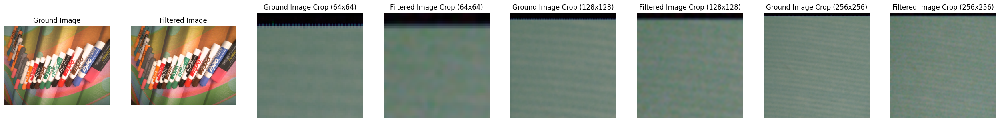

SSIM Score: 0.9485



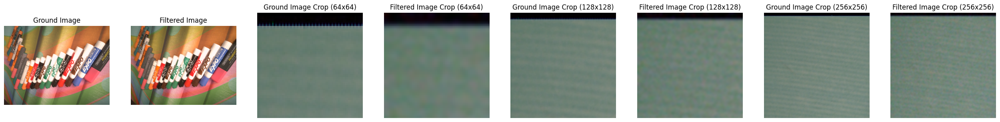

SSIM Score: 0.9482



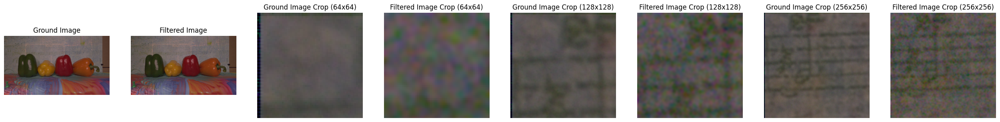

SSIM Score: 0.9370



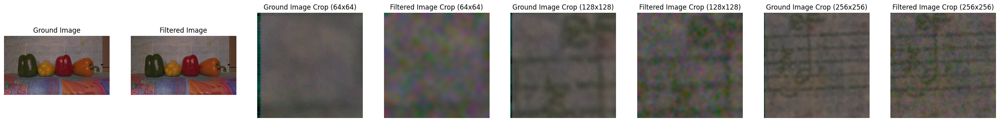

SSIM Score: 0.9366

Average SSIM Score: 0.9426


In [5]:
# Create an empty list to store the SSIM scores
ssim_scores = []

for ground_image_path, filtered_image in zip(ground_image_list, filtered_image_list):
    ground_image = Image.open(ground_image_path)
    filtered_image_obj = filtered_image

    ground_image_gray = ground_image.convert('L')
    filtered_image_gray = filtered_image_obj.convert('L')

    # Set the figure size for better visualization
    plt.figure(figsize=(32, 8))

    # Plot and print ground image
    plt.subplot(1, 8, 1)
    plt.imshow(ground_image)
    plt.title('Ground Image')
    plt.axis('off')

    # Plot and print noisy image
    plt.subplot(1, 8, 2)
    plt.imshow(filtered_image_obj)
    plt.title('Filtered Image')
    plt.axis('off')

    plt.subplot(1, 8, 3)
    plt.imshow(ground_image.crop((0, 0, 64, 64)))
    plt.title('Ground Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 4)
    plt.imshow(filtered_image_obj.crop((0, 0, 64, 64)))
    plt.title('Filtered Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 5)
    plt.imshow(ground_image.crop((0, 0, 128, 128)))
    plt.title('Ground Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 6)
    plt.imshow(filtered_image_obj.crop((0, 0, 128, 128)))
    plt.title('Filtered Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 7)
    plt.imshow(ground_image.crop((0, 0, 256, 256)))
    plt.title('Ground Image Crop (256x256)')
    plt.axis('off')

    plt.subplot(1, 8, 8)
    plt.imshow(filtered_image_obj.crop((0, 0, 256, 256)))
    plt.title('Filtered Image Crop (256x256)')
    plt.axis('off')

    plt.show()

    # Convert to NumPy arrays
    ground_image_np = np.array(ground_image_gray)
    filtered_image_np = np.array(filtered_image_gray)

    # Calculate SSIM
    ssim_score = ssim(ground_image_np, filtered_image_np)
    print(f"SSIM Score: {ssim_score:.4f}\n")

    # Append the SSIM score to the list
    ssim_scores.append(ssim_score)

# Calculate the average SSIM score
average_ssim = np.mean(ssim_scores)
print(f"Average SSIM Score: {average_ssim:.4f}")

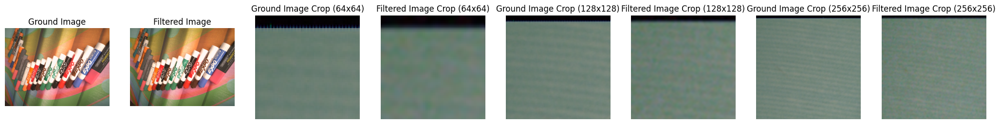

PSNR Score: 33.7588



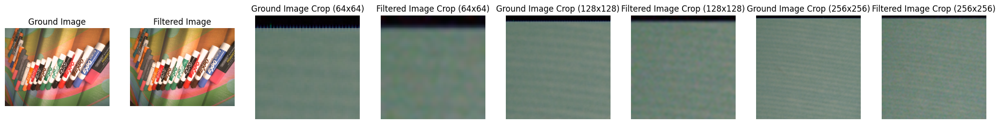

PSNR Score: 33.7583



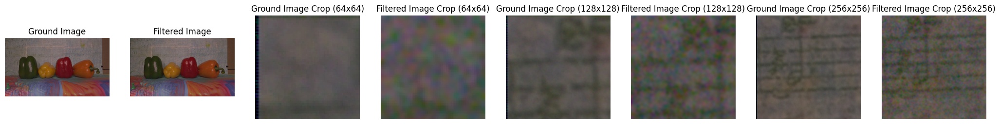

PSNR Score: 32.7774



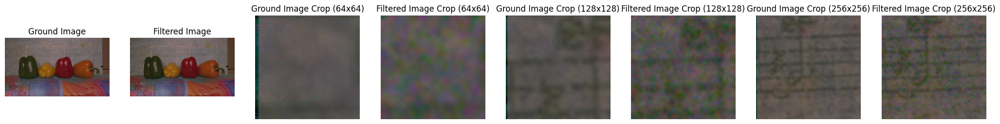

PSNR Score: 32.7718

Average PSNR Score: 33.2666


In [6]:
# Create an empty list to store the PSNR scores
psnr_scores = []

for ground_image, filtered_image in zip(ground_image_list, filtered_image_list):
    ground_image = Image.open(ground_image)
    filtered_image = filtered_image

    # Set the figure size for better visualization
    plt.figure(figsize=(26, 8))

    # Plot and print ground image
    plt.subplot(1, 8, 1)
    plt.imshow(ground_image)
    plt.title('Ground Image')
    plt.axis('off')

    # Plot and print noisy image
    plt.subplot(1, 8, 2)
    plt.imshow(filtered_image)
    plt.title('Filtered Image')
    plt.axis('off')

    plt.subplot(1, 8, 3)
    plt.imshow(ground_image.crop((0, 0, 64, 64)))
    plt.title('Ground Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 4)
    plt.imshow(filtered_image.crop((0, 0, 64, 64)))
    plt.title('Filtered Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 8, 5)
    plt.imshow(ground_image.crop((0, 0, 128, 128)))
    plt.title('Ground Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 6)
    plt.imshow(filtered_image.crop((0, 0, 128, 128)))
    plt.title('Filtered Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 8, 7)
    plt.imshow(ground_image.crop((0, 0, 256, 256)))
    plt.title('Ground Image Crop (256x256)')
    plt.axis('off')

    plt.subplot(1, 8, 8)
    plt.imshow(filtered_image.crop((0, 0, 256, 256)))
    plt.title('Filtered Image Crop (256x256)')
    plt.axis('off')

    plt.show()

    # Convert to NumPy arrays
    ground_image = np.array(ground_image)
    filtered_image = np.array(filtered_image)

    # Calculate PSNR
    psnr_score = psnr(ground_image, filtered_image)
    print(f"PSNR Score: {psnr_score:.4f}\n")

     # Append the PSNR score to the list
    psnr_scores.append(psnr_score)

# Calculate the average PSNR score
average_psnr = np.mean(psnr_scores)
print(f"Average PSNR Score: {average_psnr:.4f}")

# Ground vs. Noisy vs. Filtered

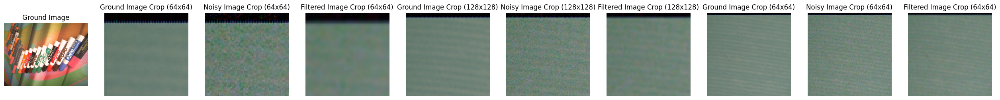

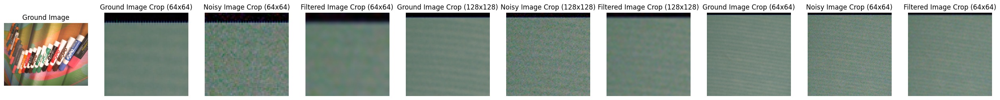

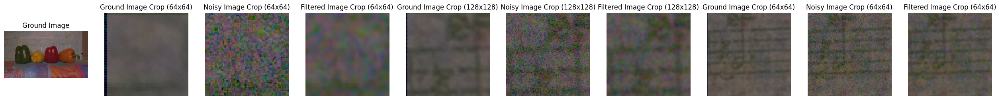

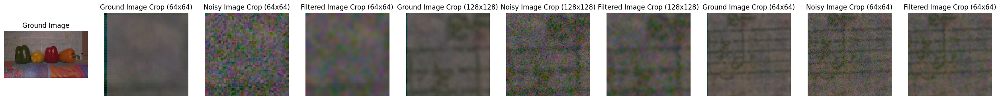

In [7]:
for ground_image, noisy_image, filtered_image in zip(ground_image_list, noisy_image_list, filtered_image_list):
    ground_image = Image.open(ground_image)
    noisy_image = Image.open(noisy_image)
    filtered_image = filtered_image

    # Set the figure size for better visualization
    plt.figure(figsize=(32, 10))

    plt.subplot(1, 10, 1)
    plt.imshow(ground_image)
    plt.title('Ground Image')
    plt.axis('off')

    plt.subplot(1, 10, 2)
    plt.imshow(ground_image.crop((0, 0, 64, 64)))
    plt.title('Ground Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 10, 3)
    plt.imshow(noisy_image.crop((0, 0, 64, 64)))
    plt.title('Noisy Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 10, 4)
    plt.imshow(filtered_image.crop((0, 0, 64, 64)))
    plt.title('Filtered Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 10, 5)
    plt.imshow(ground_image.crop((0, 0, 128, 128)))
    plt.title('Ground Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 10, 6)
    plt.imshow(noisy_image.crop((0, 0, 128, 128)))
    plt.title('Noisy Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 10, 7)
    plt.imshow(filtered_image.crop((0, 0, 128, 128)))
    plt.title('Filtered Image Crop (128x128)')
    plt.axis('off')

    plt.subplot(1, 10, 8)
    plt.imshow(ground_image.crop((0, 0, 256, 256)))
    plt.title('Ground Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 10, 9)
    plt.imshow(noisy_image.crop((0, 0, 256, 256)))
    plt.title('Noisy Image Crop (64x64)')
    plt.axis('off')

    plt.subplot(1, 10, 10)
    plt.imshow(filtered_image.crop((0, 0, 256, 256)))
    plt.title('Filtered Image Crop (64x64)')
    plt.axis('off')

    plt.show()